# Run this part every before every runtime then restart runtime

In [ ]:
!pip install -q -U opencv-python
!pip install -q -U albumentations
!pip install -q -U tensorboardX 
!echo "$(pip freeze | grep albumentations) is successfully installed"

     |████████████████████████████████| 123 kB 4.4 MB/s 
     |████████████████████████████████| 125 kB 4.5 MB/s 
albumentations==1.3.0 is successfully installed


# Import Libraries

In [ ]:
import torch 
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor, fasterrcnn_resnet50_fpn
import albumentations as A
import numpy as np
import pandas as pd
import os
import xml.etree.ElementTree as ET
import random
from PIL import Image, ImageDraw, ExifTags, ImageColor, ImageFont
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import time
from collections import Counter
from random import seed, randint
from datetime import datetime

In [ ]:
!nvidia-smi

Wed Dec 14 05:16:35 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  A100-SXM4-40GB      Off  | 00000000:00:04.0 Off |                    0 |
| N/A   30C    P0    55W / 400W |      0MiB / 40536MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data Loader

In [ ]:
images_dir =  '/content/drive/MyDrive/CV_Final_Project/Kaggle/archive/images/'
annotations_dir = '/content/drive/MyDrive/CV_Final_Project/Kaggle/archive/annotations/'

In [ ]:
# Define function decode_labels which can decode class label from intergers to strings
# and returns a list of strings that each class is represented by.
def decode_labels(lst_labels):
    labels=[]
    # Labels are appropriately encoded: with_mask:1, mask_weared_incorrect:2, without_mask:3 background:others
    for code in lst_labels:
        if code == 1:
            label = "with_mask"
        elif code == 2:
            label = "mask_weared_incorrect"
        elif code == 3:
            label = "without_mask"
        else:
            label = 'background'
        labels.append(label)
    return labels

In [ ]:
# Define function encoded_labels which can encode class label from strings to integers
# and returns a list of integers that each class is represented by.
def encoded_labels(lst_labels):
    encoded=[]
    # Labels are appropriately encoded: with_mask:1, mask_weared_incorrect:2, without_mask:3 background:others
    for label in lst_labels:
        if label == "with_mask":
            code = 1
        elif label == "mask_weared_incorrect":
            code = 2
        elif label == "without_mask":
            code = 3
        else:
            code = 0
        encoded.append(code)
    return encoded

In [ ]:
# Dataloader's collate function
def collate_fn(batch):
    return tuple(zip(*batch))

In [ ]:
# Create dataset object
class MyDataset(Dataset):
    def __init__(self, ann_dir, img_dir, transform=None, mode='train'):
        self.ann_dir = ann_dir
        self.img_dir = img_dir
        self.transform = transform
        # create a dataframe to contain information
        self.data = pd.DataFrame(columns=['Filename', 'BoundingBoxes', 'Labels', 'Area', 'N_Objects'])
        # Add rows to the df with the associated bounding boxes and the picture filename
        for file in enumerate(os.listdir(img_dir)):
            # image annotation file
            ann_file_path = os.path.join(ann_dir, file[1][:-4]) + '.xml'
            # Return bounding boxes and class attributes after reading an XML file
            objects = self.read_XML_classf(ann_file_path)
            list_labels = encoded_labels(objects[0]['labels'])
            # Create a list of the image's bounding boxes.
            list_bb = []
            list_area = []
            n_obj = len(objects[0]['objects'])
            for i in objects[0]['objects']:
                list = [i['xmin'], i['ymin'], i['xmax'], i['ymax']]
                list_bb.append(list)
                list_area.append((i['xmax'] - i['xmin']) * (i['ymax'] - i['ymin']))
            df = pd.DataFrame([[file[1], list_bb, list_labels, list_area, n_obj]],
                              columns=['Filename', 'BoundingBoxes', 'Labels', 'Area', 'N_Objects'])
            self.data = self.data.append(df)
        if mode == 'train':
            self.data = self.data[:680]
        elif mode == 'validation':
            self.data = self.data[680:700]
        elif mode == 'test':
            self.data = self.data[700:850]
        self.len = self.data.shape[0]
    
    # Get the length
    def __len__(self):
        return self.len

    def __getitem__(self, idx):
        img_name = os.path.join(self.img_dir, self.data.iloc[idx, 0])
        img = Image.open(img_name).convert('RGB')
        # the coordinates of the bounding box
        bbox = torch.tensor(self.data.iloc[idx, 1])
        labels = torch.tensor(self.data.iloc[idx, 2])
        # the bounding box areas
        area = torch.tensor(self.data.iloc[idx, 3])
        if self.transform:
            # Convert PIL image to numpy array
            img = np.array(img)
            transformed = self.transform(image=img, bboxes=bbox)
            # Convert numpy array to PIL Image
            img = Image.fromarray(transformed['image'])
            # Get transformed the bounding box
            bbox = torch.tensor(transformed['bboxes'])
        # Suppose that not all cases are crowded
        num_objs = self.data.iloc[idx, 4]
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        img = torchvision.transforms.ToTensor()(img)
        target= {"boxes": bbox, "labels": labels, "image_id": torch.tensor([idx]), "area": area, "iscrowd": iscrowd}
        return img, target

    # returns a dictionary that includes image bounding box sizes
    def read_XML_classf(self, ann_file_path):
        bboxes = [{'file': ann_file_path,'labels': [],'objects': []}]
        tree = ET.parse(ann_file_path)
        root = tree.getroot()
        objects = root.findall('object')
        for obj in objects:
            label = obj.find('name').text
            bboxes[0]['labels'].append(label)
            bndbox = obj.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            bboxes[0]['objects'].append({'xmin': xmin, 'ymin': ymin, 'xmax': xmax, 'ymax': ymax})
        return bboxes

In [ ]:
# According to the given image, draws bounding boxes and diplay them
def draw_bounding_boxes(img_tensor, target=None, prediction=None):
    img = torchvision.transforms.ToPILImage()(img_tensor)
    wid, hgt = img.size
    print(str(wid) + "x" + str(hgt))
    draw = ImageDraw.Draw(img)
    if target:
        target_bboxes = target['boxes'].numpy().tolist()
        target_labels = decode_labels(target['labels'].numpy())
        for i in range(len(target_bboxes)):
            # create rectangle patches, adding them to the axes
            draw.rectangle(target_bboxes[i], fill=None, outline='green', width=2)
            draw.text(target_bboxes[i][:2], target_labels[i], fill='green', font=None, anchor=None, spacing=4,
                      align='left', direction=None, features=None, language=None, stroke_width=0, stroke_fill=None,
                      embedded_color=False)
    if prediction:
        prediction_bboxes = prediction['boxes'].detach().cpu().numpy().tolist()
        prediction_labels = decode_labels(prediction['labels'].detach().cpu().numpy())
        for i in range(len(prediction_bboxes)):
            # create rectangle patches, adding them to the axes
            draw.rectangle(prediction_bboxes[i], fill=None, outline='red', width=2)
            draw.text(prediction_bboxes[i][:2], prediction_labels[i], fill='red', font=None, anchor=None, spacing=4,
                      align='left', direction=None, features=None, language=None, stroke_width=0, stroke_fill=None,
                      embedded_color=False)
    display(img)

In [ ]:
# train data
dataset_train = MyDataset(annotations_dir,images_dir, mode = 'train')
loader_train = DataLoader(dataset_train, batch_size=10, shuffle=True, collate_fn=collate_fn)
# validate Data
dataset_validation = MyDataset(annotations_dir,images_dir, mode = 'validation')
loader_val = DataLoader(dataset_validation, batch_size=10, shuffle=True, collate_fn=collate_fn)
# test data
dataset_test = MyDataset(annotations_dir,images_dir, mode = 'test')
loader_test = DataLoader(dataset_test, batch_size=10, shuffle=True, collate_fn=collate_fn)

400x156


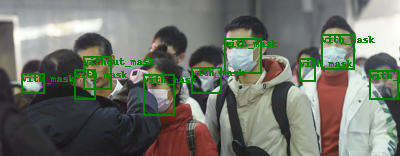

In [ ]:
img, target = dataset_train[0]
draw_bounding_boxes(img, target)

# Faster-RCNN Model

## Build Model

In [ ]:
def build_model(nclasses):
    model = fasterrcnn_resnet50_fpn(pretrained=True, min_size=400, max_size=700)
    # get the classifier's total number of input features
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, nclasses)
    return model

In [ ]:
# Applies non max supression and bounding boxes for low scores are removed
def apply_nms(orig_prediction, iou_thresh):
    # the index of the bounding boxes to keep
    keep = torchvision.ops.nms(orig_prediction['boxes'], orig_prediction['scores'], iou_thresh)
    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]
    return final_prediction

In [ ]:
# bounding boxes with low scores are removed
def remove_low_score_bb(orig_prediction, score_thresh):
    # According to the given score_thresh, low scores are removed
    index_list_scores = []
    scores = orig_prediction['scores'].detach().cpu().numpy()
    for i in range(len(scores)):
        if scores[i] > score_thresh:
            index_list_scores.append(i)
    keep = torch.tensor(index_list_scores)
    # the remained index from high score bounding boxes are kept
    final_prediction = orig_prediction
    final_prediction['boxes'] = final_prediction['boxes'][keep]
    final_prediction['scores'] = final_prediction['scores'][keep]
    final_prediction['labels'] = final_prediction['labels'][keep]

    return final_prediction

In [ ]:
def IOU(box1, box2):
    xmin_inter = max(box1[0], box2[0])
    ymin_inter = max(box1[1], box2[1])
    xmax_inter = min(box1[2], box2[2])
    ymax_inter = min(box1[3], box2[3])
    # calculate the rectangle's area of intersection.
    inter_area = max(0, xmax_inter - xmin_inter + 1) * max(0, ymax_inter - ymin_inter + 1)
    area1 = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1)
    area2 = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1)
    iou = inter_area / float(area1 + area2 - inter_area)
    assert iou >= 0
    return iou

In [ ]:
# Calculates the overall average precision
def compute_AP(ground_truth, predictions, iou_thresh=0.5, n_classes=4):
    APs = []
    class_gt = []
    class_predictions = []
    # AP is computed for each class
    for c in range(n_classes):
        for gt in ground_truth:
            if gt[4] == c:
                class_gt.append(gt)
        for predict in predictions:
            if predict[4] == c:
                class_predictions.append(predict)
        gt_amount_bb = Counter([gt[1] for gt in class_gt])
        for key, val in gt_amount_bb.items():
            gt_amount_bb[key] = np.zeros(val)
        # class predictions can be sorted by their socre
        class_predictions = sorted(class_predictions, key=lambda x: x[5], reverse=True)
        TP = np.zeros(len(class_predictions))
        FP = np.zeros(len(class_predictions))
        truth = len(class_gt)
        epsilon = 1e-6
        # each image's predictions are iterated through, and the results are compared with ground truth
        for predict_idx, prediction in enumerate(class_predictions):
            # Filter prediction image ground truths
            image_gt = [obj for obj in class_gt if obj[1] == prediction[1]]
            best_iou = -1
            best_gt_iou_idx = -1
            # Calculate IoUs by iterating across image ground truths.
            for gt_idx, gt in enumerate(image_gt):
                iou = IOU(prediction[3], gt[3])
                if iou > best_iou:
                    best_iou = iou
                    best_gt_iou_idx = gt_idx
            # the best IoU > thresh than an TP prediction
            if best_iou > iou_thresh and best_gt_iou_idx > -1:
                # Check if gt box was already covered
                if  gt_amount_bb[prediction[1]][best_gt_iou_idx] == 0:
                    # covered
                    gt_amount_bb[prediction[1]][best_gt_iou_idx] = 1
                    # true positive
                    TP[predict_idx] = 1 
                else:
                    FP[predict_idx] = 1
            else:
                FP[predict_idx] = 1
        TP_cumsum = np.cumsum(TP)
        FP_cumsum = np.cumsum(FP)
        recall = np.append([0], TP_cumsum / (truth + epsilon))
        precision = np.append([1], np.divide(TP_cumsum, (TP_cumsum + FP_cumsum + epsilon)))
        APs.append(np.trapz(precision, recall))
    return sum(APs)/len(APs)

def compute_mAP(ground_truth, predictions, n_classes):
    APs = [compute_AP(ground_truth, predictions, iou_thresh, n_classes) for iou_thresh in np.arange(0.5, 1.0, 0.05)]
    return np.mean(APs)

In [ ]:
@torch.no_grad()
def evaluate(model, data_loader, device, sequences=1):
    model.eval()
    ground_truth = []
    predictions = []
    # get all targets and outputs on test set
    for image, targets in data_loader:
        image = [img.to(device) for img in image]
        outputs = model(image)
        for idx in range(len(outputs)):
            outputs[idx] = apply_nms(outputs[idx], iou_thresh=0.5)
        # create list for targets and outputs to pass to compute_mAP()
        for s in range(sequences):
            obj_gt = 0
            obj_target = 0
            for out, target in zip(outputs, targets):
                for i in range(len(target['boxes'])):
                    ground_truth.append([s, target['image_id'].detach().cpu().numpy()[0], obj_target,
                                         target['boxes'].detach().cpu().numpy()[i],
                                         target['labels'].detach().cpu().numpy()[i], 1])
                    obj_target += 1
                for j in range(len(out['boxes'])):
                    predictions.append([s, target['image_id'].detach().cpu().numpy()[0], obj_gt,
                                        out['boxes'].detach().cpu().numpy()[j],
                                        out['labels'].detach().cpu().numpy()[j],
                                        out['scores'].detach().cpu().numpy()[j]])
                    obj_gt += 1
    mAP = compute_mAP(ground_truth, predictions, n_classes=4)
    return mAP

# Set Up TensorBoard

In [ ]:
checkpoint_path = "/content/drive/MyDrive/CV_Final_Project/"

In [ ]:
from tqdm import tqdm
from tensorboardX import SummaryWriter

In [ ]:
import datetime
name = 'Faster-RCNN-ADAM-100-0.001'
timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
save_folder = f"{checkpoint_path}/checkpoints/{name}_{timestamp}"
writer = SummaryWriter(save_folder)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/CV_Final_Project/checkpoints/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 521), started 1:17:49 ago. (Use '!kill 521' to kill it.)

<IPython.core.display.Javascript object>

## Train Model

In [ ]:
def train_model(model, loader_train, loader_train_map, loader_val, optimizer, scheduler, epochs, device):
  max_val_map = -1
  max_test_map = -1
  print("The train model starts to run")
  for epoch in range(epochs):
      print('The epoch...... {}/{} '.format(epoch + 1, epochs))
      iteration = 0
      loss_sub_list = []
      start = time.time()
      for images, targets in tqdm(loader_train):
          # aggregate images in batch loader
          images = list(image.to(device) for image in images)
          # aggregate targets in batch loader
          targets = [{key: val.to(device) for key, val in target.items()} for target in targets]
          model.train()
          # The model's output returns loss and detections.
          optimizer.zero_grad()
          # print("debug:" + target['boxes'])
          output = model(images, targets)
          # calculate cost
          losses = sum(loss for loss in output.values())
          loss_value = losses.item()
          loss_sub_list.append(loss_value)
          # update learning rate and optimizer
          losses.backward()
          optimizer.step()
          iteration += 1
      scheduler.step()
      # print the epoch loss
      val_map = evaluate(model=model, data_loader=loader_val, device=device)
      test_map = evaluate(model=model, data_loader=loader_test, device=device)
      end = time.time()
      epoch_loss = np.mean(loss_sub_list)
      writer.add_scalar('train/loss', epoch_loss, epoch)
      writer.add_scalar('val/acc', val_map, epoch)
      writer.add_scalar('test/acc', test_map, epoch)
      if(test_map >= max_test_map):
        max_test_map = test_map
        torch.save(model.state_dict(), save_folder+'/best_model.pt')
      print('The epoch loss: {:.3f} , time used: ({:.1f}s)'.format(epoch_loss, end - start))

In [ ]:
# transfer to GPU device
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
# numbers of classes: with_mask, mask_weared_incorrect, without_mask, background and build fasterrcnn model
num_classes = 4 
model = build_model(num_classes)
model = model.to(device)
print(model)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(400,), max_size=700, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(i

In [ ]:
# Set Hyper-parameters

# Network params
params = [p for p in model.parameters() if p.requires_grad]

# the ADAM optimizer may perform better than the SGD (stochastic gradient descent) optimizer
optimizer = torch.optim.Adam(params, lr=0.0001)
# optimizer = torch.optim.SGD(params, lr=0.001)

# Learning Rate, lr decreases to half every 2 epochs 
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# Number of epochs to perform
epochs = 100

In [ ]:
train_model(model=model, loader_train = loader_train, loader_train_map = loader_train, loader_val=loader_val, optimizer=optimizer, scheduler=lr_scheduler, epochs=epochs, device=device)

The train model starts to run
The epoch...... 1/100 


100%|██████████| 68/68 [04:33<00:00,  4.02s/it]


The epoch loss: 0.523 , time used: (338.2s)
The epoch...... 2/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.315 , time used: (39.9s)
The epoch...... 3/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.248 , time used: (40.1s)
The epoch...... 4/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.192 , time used: (38.4s)
The epoch...... 5/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.176 , time used: (38.0s)
The epoch...... 6/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.166 , time used: (38.6s)
The epoch...... 7/100 


100%|██████████| 68/68 [00:24<00:00,  2.80it/s]


The epoch loss: 0.155 , time used: (37.8s)
The epoch...... 8/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.153 , time used: (37.8s)
The epoch...... 9/100 


100%|██████████| 68/68 [00:24<00:00,  2.81it/s]


The epoch loss: 0.153 , time used: (37.7s)
The epoch...... 10/100 


100%|██████████| 68/68 [00:24<00:00,  2.76it/s]


The epoch loss: 0.152 , time used: (38.1s)
The epoch...... 11/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 12/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 13/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.152 , time used: (37.8s)
The epoch...... 14/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 15/100 


100%|██████████| 68/68 [00:24<00:00,  2.80it/s]


The epoch loss: 0.152 , time used: (37.8s)
The epoch...... 16/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 17/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 18/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 19/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 20/100 


100%|██████████| 68/68 [00:24<00:00,  2.80it/s]


The epoch loss: 0.152 , time used: (37.7s)
The epoch...... 21/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.7s)
The epoch...... 22/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 23/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.152 , time used: (37.8s)
The epoch...... 24/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.150 , time used: (37.7s)
The epoch...... 25/100 


100%|██████████| 68/68 [00:24<00:00,  2.81it/s]


The epoch loss: 0.152 , time used: (37.7s)
The epoch...... 26/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.150 , time used: (37.9s)
The epoch...... 27/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 28/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 29/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 30/100 


100%|██████████| 68/68 [00:24<00:00,  2.81it/s]


The epoch loss: 0.151 , time used: (37.5s)
The epoch...... 31/100 


100%|██████████| 68/68 [00:24<00:00,  2.81it/s]


The epoch loss: 0.151 , time used: (37.6s)
The epoch...... 32/100 


100%|██████████| 68/68 [00:24<00:00,  2.81it/s]


The epoch loss: 0.151 , time used: (37.5s)
The epoch...... 33/100 


100%|██████████| 68/68 [00:24<00:00,  2.80it/s]


The epoch loss: 0.151 , time used: (37.6s)
The epoch...... 34/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.152 , time used: (37.9s)
The epoch...... 35/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (38.0s)
The epoch...... 36/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.152 , time used: (38.0s)
The epoch...... 37/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 38/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (38.1s)
The epoch...... 39/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (38.0s)
The epoch...... 40/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.152 , time used: (37.8s)
The epoch...... 41/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.150 , time used: (37.9s)
The epoch...... 42/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (38.0s)
The epoch...... 43/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (38.0s)
The epoch...... 44/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 45/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 46/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 47/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.152 , time used: (37.9s)
The epoch...... 48/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.150 , time used: (38.0s)
The epoch...... 49/100 


100%|██████████| 68/68 [00:24<00:00,  2.76it/s]


The epoch loss: 0.151 , time used: (38.1s)
The epoch...... 50/100 


100%|██████████| 68/68 [00:24<00:00,  2.76it/s]


The epoch loss: 0.151 , time used: (38.1s)
The epoch...... 51/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (38.0s)
The epoch...... 52/100 


100%|██████████| 68/68 [00:24<00:00,  2.76it/s]


The epoch loss: 0.151 , time used: (38.1s)
The epoch...... 53/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.152 , time used: (38.1s)
The epoch...... 54/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.152 , time used: (38.0s)
The epoch...... 55/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (38.0s)
The epoch...... 56/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.152 , time used: (37.9s)
The epoch...... 57/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (38.0s)
The epoch...... 58/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (38.1s)
The epoch...... 59/100 


100%|██████████| 68/68 [00:24<00:00,  2.76it/s]


The epoch loss: 0.151 , time used: (38.1s)
The epoch...... 60/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (38.0s)
The epoch...... 61/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.152 , time used: (38.0s)
The epoch...... 62/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (38.0s)
The epoch...... 63/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 64/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.152 , time used: (37.8s)
The epoch...... 65/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.150 , time used: (37.8s)
The epoch...... 66/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.152 , time used: (38.0s)
The epoch...... 67/100 


100%|██████████| 68/68 [00:24<00:00,  2.75it/s]


The epoch loss: 0.151 , time used: (38.3s)
The epoch...... 68/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 69/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 70/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 71/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 72/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 73/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 74/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 75/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (38.0s)
The epoch...... 76/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 77/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 78/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 79/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 80/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.152 , time used: (37.8s)
The epoch...... 81/100 


100%|██████████| 68/68 [00:24<00:00,  2.80it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 82/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 83/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 84/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 85/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 86/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 87/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 88/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.7s)
The epoch...... 89/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.150 , time used: (37.8s)
The epoch...... 90/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 91/100 


100%|██████████| 68/68 [00:24<00:00,  2.77it/s]


The epoch loss: 0.151 , time used: (38.0s)
The epoch...... 92/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 93/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.152 , time used: (37.9s)
The epoch...... 94/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.8s)
The epoch...... 95/100 


100%|██████████| 68/68 [00:24<00:00,  2.80it/s]


The epoch loss: 0.152 , time used: (37.8s)
The epoch...... 96/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 97/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.152 , time used: (37.9s)
The epoch...... 98/100 


100%|██████████| 68/68 [00:24<00:00,  2.78it/s]


The epoch loss: 0.151 , time used: (38.0s)
The epoch...... 99/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.151 , time used: (37.9s)
The epoch...... 100/100 


100%|██████████| 68/68 [00:24<00:00,  2.79it/s]


The epoch loss: 0.152 , time used: (37.8s)


## Test Model

In [ ]:
name = 'Faster-RCNN-ADAM-100-0.001'
timestamp = '20221212-052502'
model_path = f"{checkpoint_path}/checkpoints/{name}_{timestamp}/best_model.pt"
print(model_path)
checkpoint = torch.load(model_path)
model.load_state_dict(checkpoint)

/content/drive/MyDrive/CV_Final_Project//checkpoints/Faster-RCNN-ADAM-100-0.001_20221212-052502/best_model.pt


<All keys matched successfully>

{'boxes': tensor([[188.4734,  69.6480, 212.4451,  97.9440],
        [ 77.4100,  19.9049, 111.2903,  59.3565],
        [138.5207,  41.6309, 163.2233,  69.8371],
        [ 21.5600,  42.5573,  60.2909,  82.6547],
        [325.4718,  80.4496, 335.4192,  94.7470],
        [324.2458,  84.5984, 338.2604,  96.2715],
        [325.0661,  80.1595, 337.2462,  93.6886]], device='cuda:0'), 'labels': tensor([1, 1, 1, 1, 1, 1, 3], device='cuda:0'), 'scores': tensor([0.9952, 0.9934, 0.9922, 0.9912, 0.7856, 0.1409, 0.1127],
       device='cuda:0')}
400x266


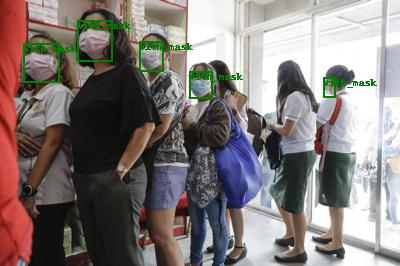

400x266


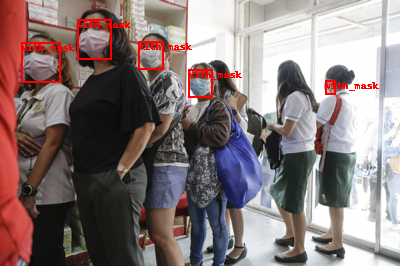

In [ ]:
# Make prediction on the basis of a random image
n = randint(0, dataset_test.len)
img, target = dataset_test[n]
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]
print(prediction)
nms_prediction = apply_nms(prediction, iou_thresh=0.5)
# Remove low score boxes below score_thresh
filtered_prediction = remove_low_score_bb(nms_prediction, score_thresh=0.3)
# Draw bounding boxes
draw_bounding_boxes(img.detach().cpu(), target=target)
draw_bounding_boxes(img.detach().cpu(), prediction=filtered_prediction)

The original picture
300x199


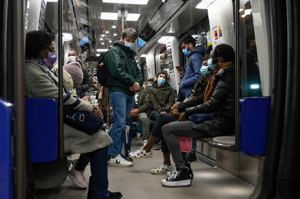

The predicted picture
300x199


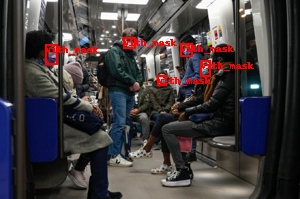

The original picture
300x450


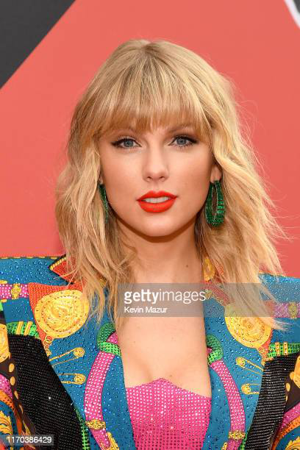

The predicted picture
300x450


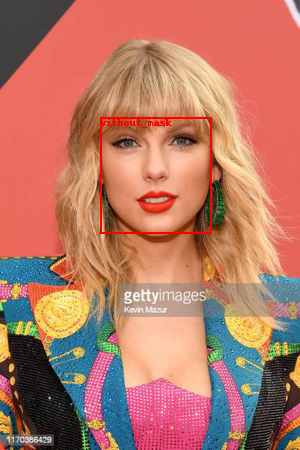

In [ ]:
test_imgs_dir = '/content/drive/MyDrive/CV_Final_Project/test_pics/'
for imgs in os.listdir(test_imgs_dir):
  myimg = Image.open(test_imgs_dir + imgs).convert('RGB')
  w,h = myimg.size
  h = 300/w*h
  myimg = myimg.resize([300, int(h)])
  myimg = np.array(myimg)
  myimg = Image.fromarray(myimg)
  myimg = torchvision.transforms.ToTensor()(myimg)
  model.eval()
  with torch.no_grad():
    prediction = model([myimg.to(device)])[0]
  nms_prediction = apply_nms(prediction, iou_thresh=0.5)
  # Remove low score boxes below score_thresh
  filtered_prediction = remove_low_score_bb(nms_prediction, score_thresh=0.9)
  print("The original picture")
  draw_bounding_boxes(myimg.detach().cpu())
  print("The predicted picture")
  draw_bounding_boxes(myimg.detach().cpu(), prediction=filtered_prediction)